In [145]:
import cv2
import numpy as np
import os, sys
from glob import glob
import matplotlib.pyplot as plt
import pandas as pd
np.set_printoptions(threshold=sys.maxsize)

In [101]:
img = cv2.imread('original/john0002.jpg')

In [215]:
def consecutive(data, stepsize=1):
    return np.split(data, np.where(np.diff(data) > stepsize)[0]+1)

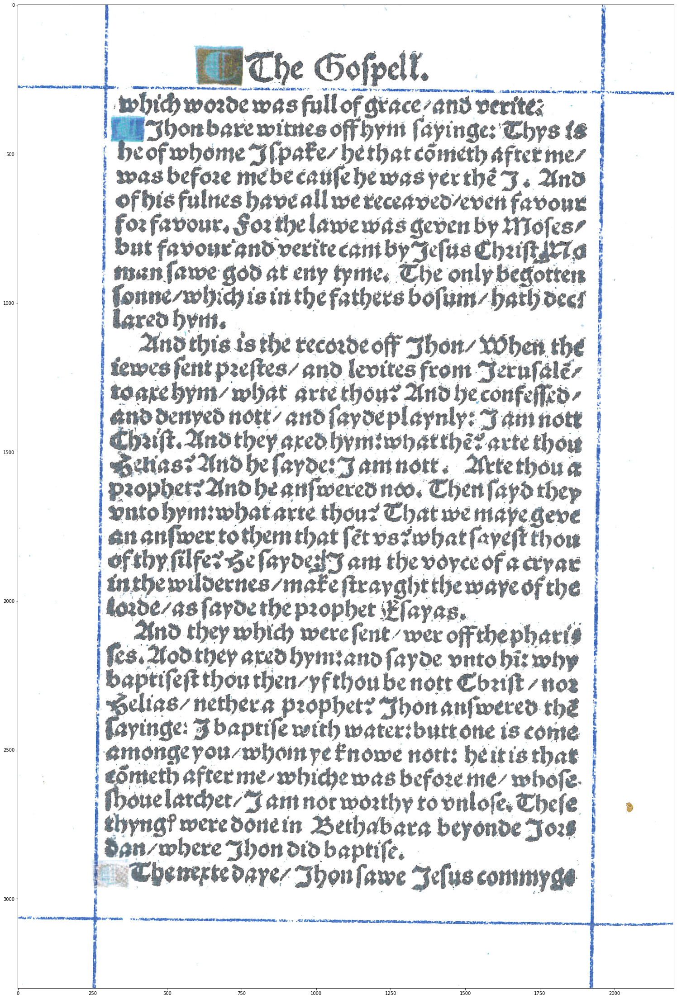

In [102]:
x = 600
y = 200
width = 2200
height = 3300
cropped = img[y:y+height, x:x+width]
plt.rcParams["figure.figsize"] = (200, 40)
plt.imshow(cropped)
plt.show()

In [281]:
mean = np.mean(cropped[0], axis=1)
ink = [for ]
#print(consecutive(ink))

[array([255.        , 255.        , 255.        , 255.        ,
       255.        , 255.        , 255.        , 255.        ,
       255.        , 255.        , 255.        , 255.        ,
       255.        , 255.        , 255.        , 255.        ,
       255.        , 255.        , 255.        , 255.        ,
       255.        , 255.        , 255.        , 255.        ,
       255.        , 255.        , 255.        , 255.        ,
       255.        , 255.        , 255.        , 255.        ,
       255.        , 255.        , 255.        , 255.        ,
       255.        , 255.        , 255.        , 255.        ,
       255.        , 255.        , 255.        , 255.        ,
       255.        , 255.        , 255.        , 255.        ,
       255.        , 255.        , 255.        , 255.        ,
       255.        , 255.        , 255.        , 255.        ,
       255.        , 255.        , 255.        , 255.        ,
       255.        , 255.        , 255.        , 255. 

In [234]:
df = pd.DataFrame(cropped[0], columns=['R','G','B'])
df['mean'] = df.mean(axis=1) 
df['ink'] = df['mean'].apply(lambda x: 1 if x < 255 else 0)
df['idx'] = df.index
df.iloc[176:178]

,R,G,B,mean,ink,idx
176,249,255,254,252.666667,1,176
177,255,255,255,255.000000,0,177


In [236]:
groups = consecutive(list(df.groupby('ink').get_group(1)['idx']))
groups

[array([172, 173, 174, 175, 176]),
 array([178, 179]),
 array([292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304,
        305, 306, 307]),
 array([1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099]),
 array([1231]),
 array([1235]),
 array([1276, 1277, 1278, 1279, 1280, 1281, 1282, 1283]),
 array([1285]),
 array([1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964, 1965, 1966,
        1967, 1968, 1969, 1970, 1971])]

In [278]:
df_groups = pd.DataFrame([[g, len(g)] for g in groups], columns=['set', 'size'])
df_groups = df_groups.sort_values(by=['size'], ascending=False)[0:2]
list(df_groups['size'][0:2])
df_groups

,set,size
2,"[292, 293, 294, 295, 296, 297, 298, 299, 300, ...",16
8,"[1956, 1957, 1958, 1959, 1960, 1961, 1962, 196...",16


In [39]:
img = cv2.imread('cropped/john0002.jpg')
gray = cv2.cvtColor(img.copy(), cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray.copy(), 225, 255, cv2.THRESH_BINARY_INV)[1]
edges = cv2.Canny(gray, 10, 250, apertureSize=7)

In [78]:
(_, cnts, hier) = cv2.findContours(thresh.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

In [41]:
print(len(cnts))

4033


In [42]:
# Get the lines. (= long contours > 600)
lines = []
for c in cnts:
    epsilon = 0.1*cv2.arcLength(c,True)
    approx = cv2.approxPolyDP(c,epsilon,True)
    if cv2.arcLength(c, True) > 700.0:
        lines.append(c)
len(lines)

23

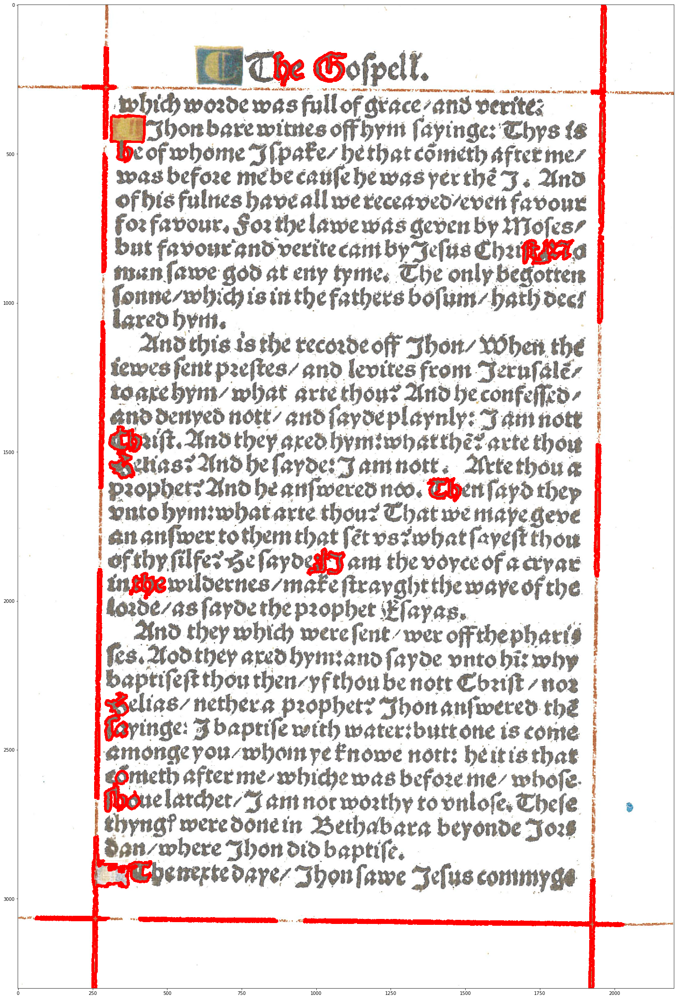

In [43]:
cnt = np.array(lines)
wc = cv2.drawContours(img.copy(), cnt, -1, (255, 0, 0), 7)
plt.rcParams["figure.figsize"] = (200, 40)
plt.imshow(wc)
plt.show()

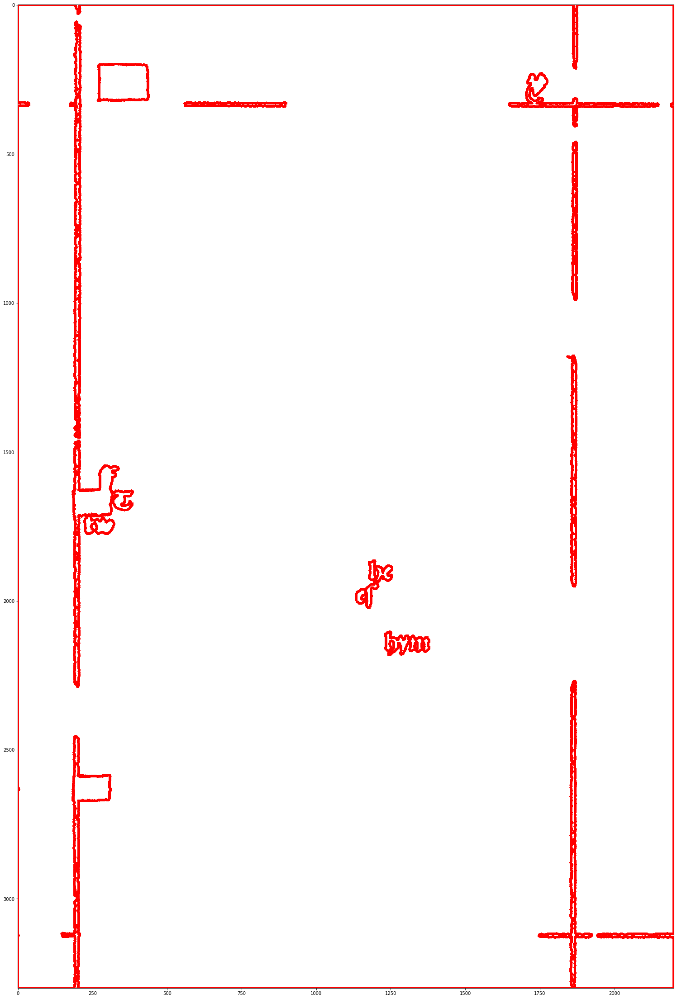

In [98]:
img = cv2.imread('cropped/john0003.jpg')
gray = cv2.cvtColor(img.copy(), cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray.copy(), 225, 255, cv2.THRESH_BINARY)[1]
edges = cv2.Canny(gray, 10, 250, apertureSize=3)
(_, cnts, hier) = cv2.findContours(thresh.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
lines = []
for c in cnts:
    epsilon = 0.1*cv2.arcLength(c,True)
    approx = cv2.approxPolyDP(c,epsilon,True)
    if cv2.arcLength(c, True) > 700.0:
        lines.append(c)
len(lines)
cnt = np.array(lines)
blank = np.ones((3300, 2200, 3), np.uint8)*255
wc = cv2.drawContours(blank, cnt, -1, (255, 0, 0), 7)
plt.rcParams["figure.figsize"] = (200, 40)
plt.imshow(wc)
plt.show()

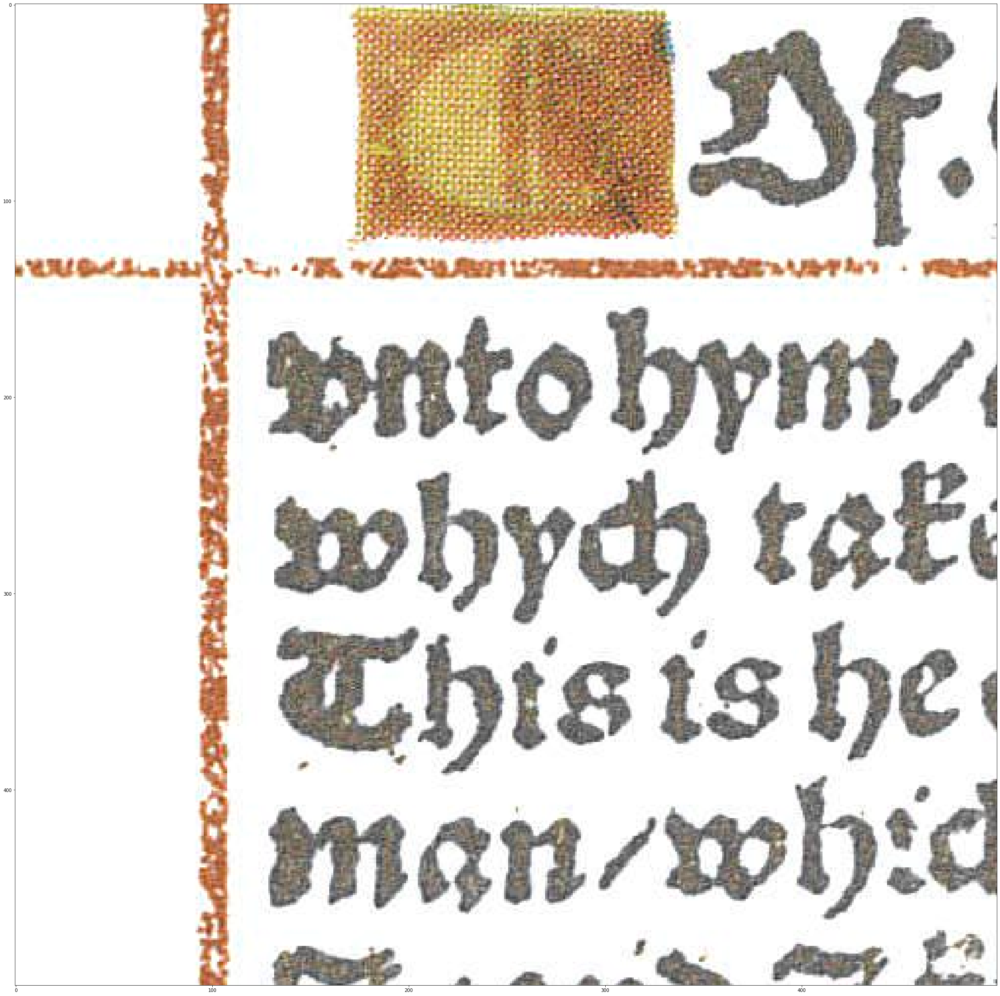

In [59]:
x = 100
y = 200
width = 500
height = 500
topleft = img[y:y+height, x:x+width]
plt.rcParams["figure.figsize"] = (200, 40)
plt.imshow(topleft)
plt.show()

In [92]:
for r in topleft[1]:
    print(np.mean(r))

255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
255.0
252.66666666666666
251.66666666666666
251.33333333333334
240.0
145.33333333333334
120.0
136.0
120.0
130.66666666666666
165.66666666666666
155.0
146.66666666666666
115.0
126.66666666666667
144.0
146.33333333333334
168.33333333333334
243.66666666666666
251.33333333333334
248.66666666666666
254.66666666666666
248.66666666666666
247.33333333333334
253.33333333333334
253.33333333333334
254.0
253.66666666666666
253.66666666666666
254.0
254.6666666666

In [140]:
print(min(lines[0][:,0][:,0]), max(lines[0][:,0][:,0]))
print(min(lines[0][:,0][:,1]), max(lines[0][:,0][:,1]))
print(min(lines[1][:,0][:,0]), max(lines[1][:,0][:,0]))
print(min(lines[1][:,0][:,1]), max(lines[1][:,0][:,1]))

371 3218
4687 4708
346 3190
214 236


In [141]:
leftmost0 = min(lines[0][:,0], key = lambda x : x[0])
leftmost1 = min(lines[1][:,0], key = lambda x : x[0])

topindex = 0 if leftmost0[0] < leftmost1[0] else 1
topleft = min(lines[topindex][:,0], key = lambda x : x[0])
topright = max(lines[topindex][:,0], key = lambda x : x[0])

margin = 10
x1 = topleft[0] - margin
x2 = topright[0] + margin
#y1 = (topleft[1] if topleft[1] < topright[1] else topright[1]) - margin
y1 = 0
y2 = (topright[1] if topright[1] > topleft[1] else topleft[1]) + margin

print(topleft)
print(topright)
print(x1, y1, x2, y2)

[346 230]
[3190  221]
336 0 3200 240


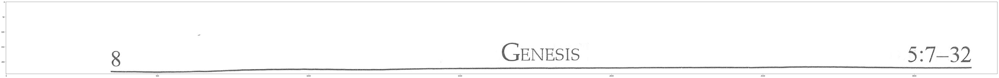

In [142]:
cut = img[0:240]
plt.rcParams["figure.figsize"] = (100, 80)
plt.imshow(cut)
plt.show()

In [145]:
edges = cv2.Canny(cut, 50, 150, apertureSize=3)
cutlines = cv2.HoughLines(edges, 1, np.pi/180, 600)
print(cutlines.shape)
print(cutlines)

(2, 1, 2)
[[[219.          1.5707964]]

 [[223.          1.5707964]]]


-3275 218 3274 219
-3275 222 3274 223


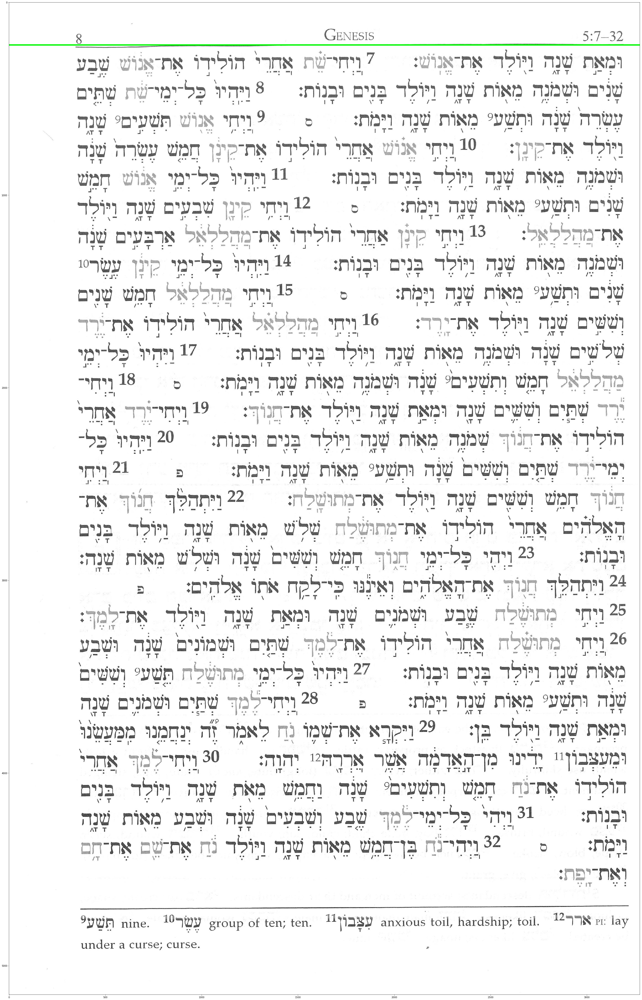

In [146]:
maxlength = img.shape[:2][1]
for line in cutlines:
    for rho,theta in line:
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a*rho
        y0 = b*rho
        x1 = int(x0 + maxlength*(-b))
        y1 = int(y0 + maxlength*(a))
        x2 = int(x0 - maxlength*(-b))
        y2 = int(y0 - maxlength*(a))
        print(x1, y1, x2, y2)

        cv2.line(img,(x1,y1),(x2,y2),(0,255,0), 2)
plt.imshow(img)
plt.show()